## Predicting Human Action using Convolutional Neural Network(CNN) + Long Short-Term Memory(LSTM)

### Initialize some of the imports for loading the data and setting necessary variables

In [3]:
import os
import cv2
import numpy as np
# Specify Dataset paths
dataset_dir = "data/UCF101/UCF-101"

# Set image width and height
img_width, img_height = 64, 64

# Set sequences length
seq_length = 20

# Action labels
action_labels = ['Archery', 'Diving', 'Drumming', 'Fencing']


### Define function to extract frames per given sequence length

In [2]:
# Extract frame using OpenCV
def extract_frames(video_path):
    frames_list = []

    cap = cv2.VideoCapture(video_path)
    total_frames = cap.get(cv2.CAP_PROP_FRAME_COUNT)

    # 'skip_frames' is used to reduce the number of frames for input
    skip_frames = max(int(total_frames/seq_length), 1)

    for frame_count in range(seq_length):

        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_count * skip_frames)
        ret, frame = cap.read()

        if not ret:
            break

        resized_frame = cv2.resize(frame, (img_width, img_height))
        normalized_frame = resized_frame/255
        frames_list.append(normalized_frame)

    cap.release()
    return frames_list

### Define function for data extraction

In [3]:
def extract_data():

    features = []
    labels = []
    video_file_paths = []

    for class_idx, class_name in enumerate(action_labels):

        print(f'Extracting Data of Class: {class_name}')
        files_list = os.listdir(os.path.join(dataset_dir, class_name))

        # Extract features and labels from multiple videos
        for files in files_list:

            video_file_path = os.path.join(dataset_dir, class_name, files)
            frames = extract_frames(video_file_path)

            if len(frames) == seq_length:

                features.append(frames)
                labels.append(class_idx)
                video_file_paths.append(video_file_path)

    features = np.asarray(features)
    labels = np.array(labels)

    return features, labels, video_file_paths

In [4]:
features, labels, video_file_paths = extract_data()

Extracting Data of Class: Archery
Extracting Data of Class: Diving
Extracting Data of Class: Drumming
Extracting Data of Class: Fencing


In [14]:
# 567 of data with 20 frames each with the size of 64x64x3(rgb)
features.shape

(567, 20, 64, 64, 3)

### Model Implementations

#### Convert desired labels to one-hot encoding _**(Archer, Diving, Drumming, Fencing)**_

In [5]:
from tensorflow.keras.utils import to_categorical
labels_to_one_hot_encoded = to_categorical(labels)

#### Perform train test splits for the features and the labels for each action

In [6]:
from sklearn.model_selection import train_test_split
features_train, features_test, labels_train, labels_test = train_test_split(features, 
                                                                            labels_to_one_hot_encoded, 
                                                                            test_size=0.25,
                                                                            shuffle=True)

#### Model Implementations

The idea behind using CNN is for feature extraction, with its known prowess in concisely collecting the details of each input using convolutional method.

This is combine with the power of LSTM which is also known for feature extraction but for time series data.

Combining them together can prove to increase the accuracy for predicting the actions between multiple frames.

In [4]:
# Import necessary dl libraries
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import TimeDistributed
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense

def create_CNN_LSTM_model():
    model = Sequential()

    # Input shape is the shape of each features
    model.add(TimeDistributed(Conv2D(32, kernel_size = (3, 3),activation = "relu"), 
                              input_shape = (seq_length, img_height, img_width, 3)))
    model.add(TimeDistributed(Dropout(0.2)))    
    
    model.add(TimeDistributed(Conv2D(64, kernel_size = (3, 3),
                                      activation = "relu")))
    model.add(TimeDistributed(MaxPooling2D(pool_size = (4, 4))))  
    model.add(TimeDistributed(Dropout(0.2)))    
    
    model.add(TimeDistributed(Conv2D(64, kernel_size = (3, 3),
                                      activation = "relu")))
    model.add(TimeDistributed(MaxPooling2D(pool_size = (3, 3))))  
    model.add(TimeDistributed(Dropout(0.2)))    
    
    model.add(TimeDistributed(Conv2D(32, kernel_size = (3, 3),
                                      activation = "relu")))
    model.add(TimeDistributed(MaxPooling2D(pool_size = (2, 2))))  

    model.add(TimeDistributed(Flatten()))   
    
    model.add(LSTM(units = 16))                                       
    model.add(Dense(len(action_labels), activation = "softmax"))

    return model

In [5]:
CNN_LSTM = create_CNN_LSTM_model()
CNN_LSTM.summary()

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\core\wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed                │ (None, 20, 62, 62, 32) │           896 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_1              │ (None, 20, 62, 62, 32) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_2              │ (None, 20, 60, 60, 64) │        18,496 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_3              │ (None, 20, 15, 15, 64) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_4              │ (None, 20, 15, 15, 64) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_5              │ (None, 20, 13, 13, 64) │        36,928 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_6              │ (None, 20, 4, 4, 64)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_7              │ (None, 20, 4, 4, 64)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_8              │ (None, 20, 2, 2, 32)   │        18,464 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_9              │ (None, 20, 1, 1, 32)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_10             │ (None, 20, 32)         │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 16)             │         3,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4)              │            68 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 77,988 (304.64 KB)

 Trainable params: 77,988 (304.64 KB)

 Non-trainable params: 0 (0.00 B)

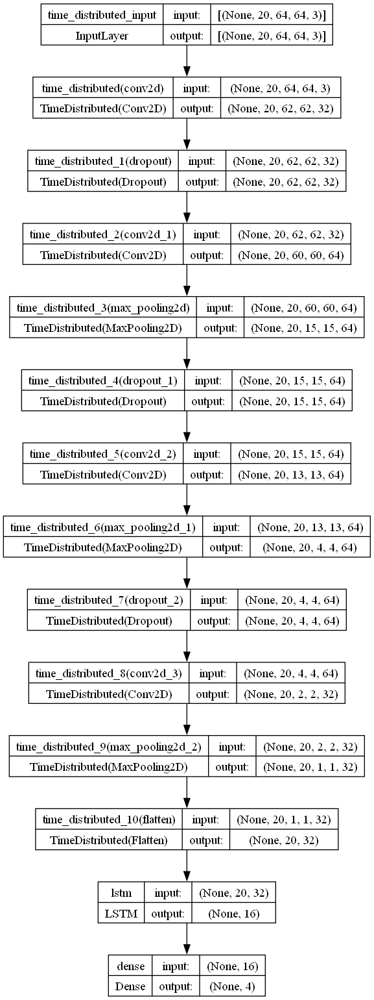

In [9]:
from tensorflow.keras.utils import plot_model
plot_model(CNN_LSTM, to_file = 'CNNLSTM_model.png', show_shapes = True, show_layer_names = True)

In [10]:
CNN_LSTM.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics=(["accuracy"]))

In [11]:
import tensorflow as tf
features_train = tf.convert_to_tensor(features_train, dtype = tf.float32)
labels_train = tf.convert_to_tensor(labels_train, dtype = tf.float32)

In [12]:
# Define early stopping
from tensorflow.keras.callbacks import EarlyStopping
callback = EarlyStopping(monitor = 'loss', patience = 5)

#### Model Training

In [13]:
CNN_LSTM_history = CNN_LSTM.fit(x = features_train,
                                y = labels_train, epochs = 50, batch_size = 4,
                                shuffle = True, validation_split = 0.2, callbacks = [callback])

Epoch 1/50


85/85 [==============================] - 24s 264ms/step - loss: 1.3441 - accuracy: 0.3912 - val_loss: 1.1721 - val_accuracy: 0.5294
Epoch 2/50
85/85 [==============================] - 23s 271ms/step - loss: 1.2069 - accuracy: 0.5059 - val_loss: 1.0707 - val_accuracy: 0.5529
Epoch 3/50
85/85 [==============================] - 23s 275ms/step - loss: 1.0802 - accuracy: 0.5471 - val_loss: 0.9640 - val_accuracy: 0.6118
Epoch 4/50
85/85 [==============================] - 23s 275ms/step - loss: 0.9833 - accuracy: 0.5647 - val_loss: 0.8608 - val_accuracy: 0.7176
Epoch 5/50
85/85 [==============================] - 23s 270ms/step - loss: 0.8248 - accuracy: 0.6765 - val_loss: 0.9086 - val_accuracy: 0.5765
Epoch 6/50
85/85 [==============================] - 22s 260ms/step - loss: 0.7593 - accuracy: 0.7147 - val_loss: 0.6706 - val_accuracy: 0.7294
Epoch 7/50
85/85 [==============================] - 22s 258ms/step - loss: 0.7722 - accuracy: 0.6588 - val_loss: 0.6897 - val_accuracy: 0.69

KeyboardInterrupt: 

#### Model Prediction

In [64]:
model_evaluation = CNN_LSTM.evaluate(features_test, labels_test)

5/5 [==============================] - 1s 230ms/step - loss: 0.0633 - accuracy: 0.9789


#### Save the model that is satisfactory

In [65]:
import datetime as dt
model_evaluation_loss, model_evaluation_accuracy = model_evaluation

dt_format = '%Y_%m_%d__%H_%M_%S'
current_dt = dt.datetime.now()
current_dt_string = dt.datetime.strftime(current_dt, dt_format)

model_file_name = f'cnn_lstm__Date_Time_{current_dt_string}___loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'

# Save model
CNN_LSTM.save(model_file_name)

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


#### Model Evaluations

In [66]:
import matplotlib.pyplot as plt
def plot_evaluate(model_training_hist, metric_1, metric_2, plot_name):

    # Get metric values for loss and accuracy
    metric_value_1 = model_training_hist.history[metric_1]
    metric_value_2 = model_training_hist.history[metric_2]

    epochs = range(len(metric_value_1))

    plt.plot(epochs, metric_value_1, 'blue', label = metric_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_2)

    plt.title(str(plot_name))

    plt.legend()

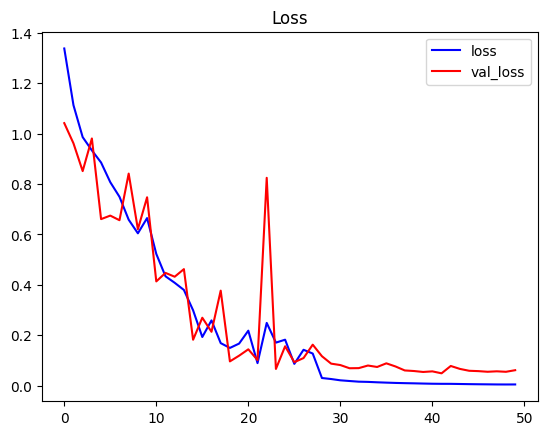

In [67]:
plot_evaluate(CNN_LSTM_history, 'loss', 'val_loss', 'Loss')

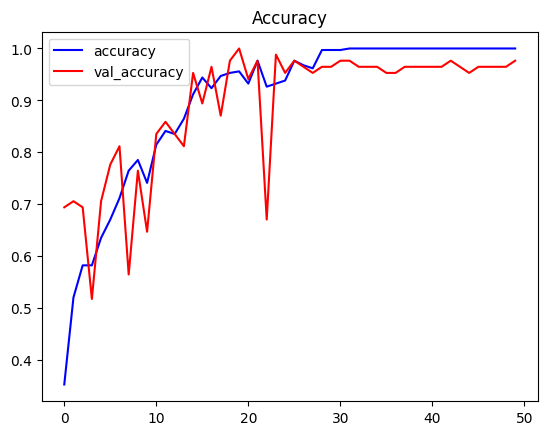

In [68]:
plot_evaluate(CNN_LSTM_history, 'accuracy', 'val_accuracy', 'Accuracy')

#### Conclusion:

Slight overfitting after 30 epochs, but overall can perform with good accuracy on unseen data

_Optimization of hyperparameter are still required and finetuning the model can yield greater results_

### Testing the model on youtube videos

Testing the capability of the model on unseen data

We are using deque to consistently remove frames and add frames for each sequences

In [17]:
from moviepy.editor import *
from collections import deque

# Similar to the data extraction function
def predict_action(video_file_paths, output_file_path, seq_length):

    cap = cv2.VideoCapture(video_file_paths)

    original_vid_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_vid_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'),
                                   cap.get(cv2.CAP_PROP_FPS), (original_vid_width, original_vid_height))
    
    frames_queue = deque(maxlen = seq_length)

    predicted_action = ''

    while cap.isOpened():
        ret, frame = cap.read()

        if not ret:
            break

        resized_frame = cv2.resize(frame, (img_width, img_height))
        normalized_frame = resized_frame/255
        frames_queue.append(normalized_frame)

        if len(frames_queue) == seq_length:

            predicted_labels_prob = CNN_LSTM.predict(np.expand_dims(frames_queue, axis = 0))[0]
            predicted_label = np.argmax(predicted_labels_prob)
            predicted_action = action_labels[predicted_label]

        cv2.putText(frame, predicted_action, (10,100), cv2.FONT_HERSHEY_COMPLEX, 2, (255, 0, 0), 2)
        video_writer.write(frame)
    
    cap.release()
    video_writer.release()

In [12]:
output_video_path = f'CNNLSTMoutput/test_outcome_cnn_lstm.mp4'

predict_action('test2.mp4', output_video_path, seq_length= seq_length)

VideoFileClip(output_video_path, audio=False, target_resolution=(300, None)).ipython_display()

1/1 [==============================] - 0s 41ms/step
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [15]:
predict_action('test3.mp4', 'CNNLSTMoutput/test_outcome_cnn_lstm_fencing.mp4', seq_length= seq_length)
VideoFileClip('CNNLSTMoutput/test_outcome_cnn_lstm_fencing.mp4', audio=False, target_resolution=(300, None)).ipython_display()

1/1 [==============================] - 0s 46ms/step
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [18]:
predict_action('test.mp4', 'CNNLSTMoutput/test_outcome_cnn_lstm_drumming.mp4', seq_length= seq_length)
VideoFileClip('CNNLSTMoutput/test_outcome_cnn_lstm_drumming.mp4', audio=False, target_resolution=(300, None)).ipython_display()

1/1 [==============================] - 0s 39ms/step
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [19]:
predict_action('test4.mp4', 'CNNLSTMoutput/test_outcome_cnn_lstm_archery.mp4', seq_length= seq_length)
VideoFileClip('CNNLSTMoutput/test_outcome_cnn_lstm_archery.mp4', audio=False, target_resolution=(300, None)).ipython_display()

1/1 [==============================] - 0s 82ms/step
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [20]:
predict_action('test5.mp4', 'CNNLSTMoutput/test_outcome_cnn_lstm_diving.mp4', seq_length= seq_length)
VideoFileClip('CNNLSTMoutput/test_outcome_cnn_lstm_diving.mp4', audio=False, target_resolution=(300, None)).ipython_display()

1/1 [==============================] - 0s 82ms/step
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
